# Imports

In [1]:
import os
# This line selects a GPU in a machine, comment it if you want to use all GPUs
os.environ['CUDA_VISIBLE_DEVICES'] = "2"

import torch

from shap_e.models.download import load_model, load_config
from shap_e.diffusion.gaussian_diffusion import diffusion_from_config
from shap_e.util.notebooks import decode_latent_mesh
from shap_e.diffusion.sample import sample_latents

import plotly.graph_objects as go
import plotly.offline as pyo
import numpy as np
from plyfile import PlyData

# Set plotly to offline mode to visualize
pyo.init_notebook_mode(connected=True)

# Parameters
Here you choose the model you want to use to generate shapes.

In [2]:
# Model tensors file
MODEL_FILE = "./model_ckpts/med_shape_e_epoch49.pth"

# Constants

In [3]:
# Predict one example at the time
BATCH_SIZE = 1

# Temporal model to save .ply file
MESH_FILE = './mesh.ply'

# Load base model

In [4]:
# Setting torch to GPU
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
# Load transmitter part of Shap-e
TRANSMITTER = load_model('transmitter', device=DEVICE)

In [6]:
# Load base model
MODEL = load_model('text300M', device=DEVICE)

In [7]:
# Load diffusion model
DIFFUSION = diffusion_from_config(load_config('diffusion'))

In [8]:
# Guidance scale for model
GUIDANCE_SCALE = 15.0

# Load weights

In [9]:
# Charge trained weights for the model
WEIGHTS = MODEL.load_state_dict(
    torch.load(
        MODEL_FILE,
        map_location=DEVICE
    )['model_state_dict']
)

# PROMPT SETTING (PUT YOUR TEXT PROMPT HERE)
Right now it is finetuned to generate variations of "Aorta", "Kidney" and "Liver". However, you can test anything and see what's the output.

**If you want to generate a new mesh, just run all the cells from here onwards.**

In [10]:
# Prompt to generate a mesh
prompt = "right kidney"

# Generating latents

In [11]:
# Generate latents using the diffusion model
latents = sample_latents(
    batch_size=BATCH_SIZE,
    model=MODEL,
    diffusion=DIFFUSION,
    guidance_scale=GUIDANCE_SCALE,
    model_kwargs=dict(texts=[prompt] * BATCH_SIZE),
    progress=True,
    clip_denoised=True,
    use_fp16=True,
    use_karras=True,
    karras_steps=64,
    sigma_min=1e-3,
    sigma_max=160,
    s_churn=0
)

  0%|          | 0/64 [00:00<?, ?it/s]

# Generating mesh

In [12]:
# Generate the mesh using the transmitter model
gen_mesh = decode_latent_mesh(TRANSMITTER, latents).tri_mesh()

# Save mesh to temp file
with open(os.path.join(MESH_FILE), 'wb') as f:
    gen_mesh.write_ply(f)

/home/jdrodriguezp1234/MLT-final-project/project/shap-e/shap_e/models/stf/renderer.py:286: UserWarning:

exception rendering with PyTorch3D: No module named 'pytorch3d'

/home/jdrodriguezp1234/MLT-final-project/project/shap-e/shap_e/models/stf/renderer.py:287: UserWarning:

falling back on native PyTorch renderer, which does not support full gradients



# View your generated mesh

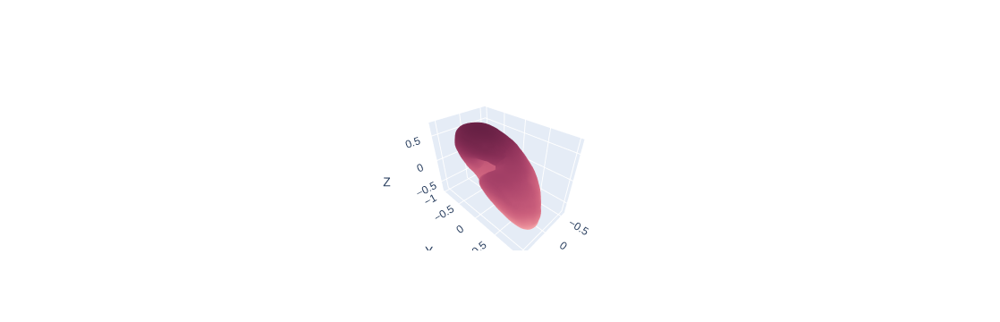

In [13]:
# Read PLY file
plydata = PlyData.read(MESH_FILE)
vertices = plydata['vertex']
x, y, z = vertices['x'], vertices['y'], vertices['z']

# Interactive 3D plot
fig = go.Figure(data=[go.Scatter3d(
    x=x, y=y, z=z,
    mode='markers',
    marker=dict(size=2, color=z, colorscale="Burg"),
)])

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)
pyo.iplot(fig)